# Home Credit Default Risk - Visualization

This whole notebook will be about Visualization for the main application_train dataset

In [1]:
from IPython.display import Image

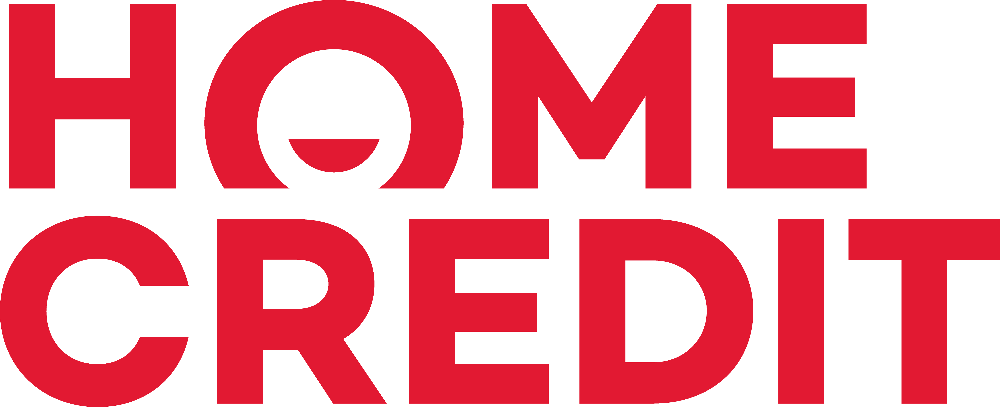

In [22]:
Image(filename='Pictures/home_credit_logo.png') 

### Predict how capable each applicant is of repaying a loan

Columns description: https://docs.google.com/spreadsheets/d/1Ano-dLFAqBLJk2MCrVlClpj3QnOMZGBtQDbqeg12XKU/edit?usp=sharing

Some important varibales: https://docs.google.com/spreadsheets/d/195u9E27V5u3yegTFHIAG0YeMPytgPSqvC8gICF-soHg/edit?usp=sharing

In [2]:
# numpy and pandas for data manipulation
import numpy as np
import pandas as pd 

# sklearn preprocessing for dealing with categorical variables
from sklearn.preprocessing import LabelEncoder

# File system manangement
import os

# Suppress warnings 
import warnings
warnings.filterwarnings('ignore')

# matplotlib and seaborn for plotting
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "Home Credit Deafault Risk"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID)
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

In [4]:
# Training data
train_dataset = pd.read_csv('Datasets/Experian/application_train.csv')

print('Train data shape: ', train_dataset.shape)

train_dataset.head()

Train data shape:  (307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


**Timing code (contextmanager)**

In [5]:
from contextlib import contextmanager
from timeit import default_timer

@contextmanager
def elapsed_timer():
    start = default_timer()
    elapser = lambda: default_timer() - start
    yield lambda: elapser()
    end = default_timer()
    elapser = lambda: end-start

**This is the relationship between different datasets**

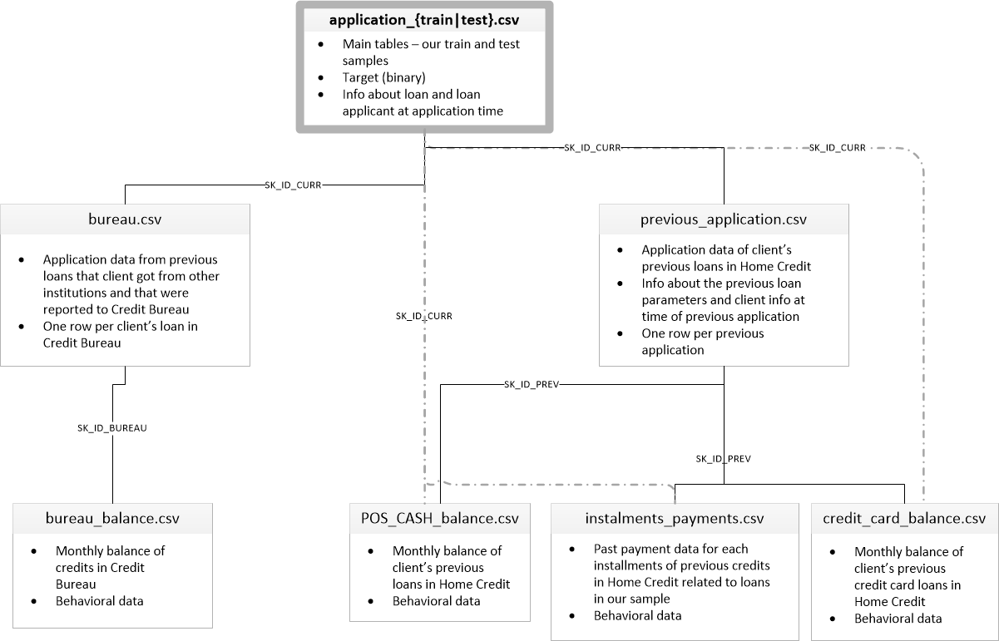

In [24]:
Image(filename='Pictures/data_map_home_credit.png') 

In [6]:
important_features = ['TARGET', 'NAME_CONTRACT_TYPE', 'AMT_INCOME_TOTAL', 'CODE_GENDER', 'CNT_CHILDREN',
             'FLAG_OWN_REALTY', 'AMT_CREDIT', 'APARTMENTS_AVG', 'OCCUPATION_TYPE', 
             'CNT_FAM_MEMBERS', 'ORGANIZATION_TYPE', 'NAME_FAMILY_STATUS', 'DAYS_EMPLOYED', 'DAYS_BIRTH']

important_features = train_dataset.filter(items=important_features)

print("important_features' shape: ", important_features.shape)

important_features' shape:  (307511, 14)


In [7]:
important_features['DAYS_BIRTH'] = (important_features['DAYS_BIRTH']*(-1))/365.25
important_features['DAYS_BIRTH'].head()

0    25.902806
1    45.900068
2    52.145106
3    52.032854
4    54.570842
Name: DAYS_BIRTH, dtype: float64

In [8]:
important_features['DAYS_EMPLOYED'] = (important_features['DAYS_EMPLOYED']*(-1))/365.25
important_features['DAYS_EMPLOYED'].head()

0    1.744011
1    3.252567
2    0.616016
3    8.320329
4    8.317591
Name: DAYS_EMPLOYED, dtype: float64

In [9]:
important_features = important_features.rename(columns={'DAYS_BIRTH': 'YEAR_BIRTH', 'DAYS_EMPLOYED': 'YEAR_EMPLOYED'})

Saving figure important_attributes_histogram_plots


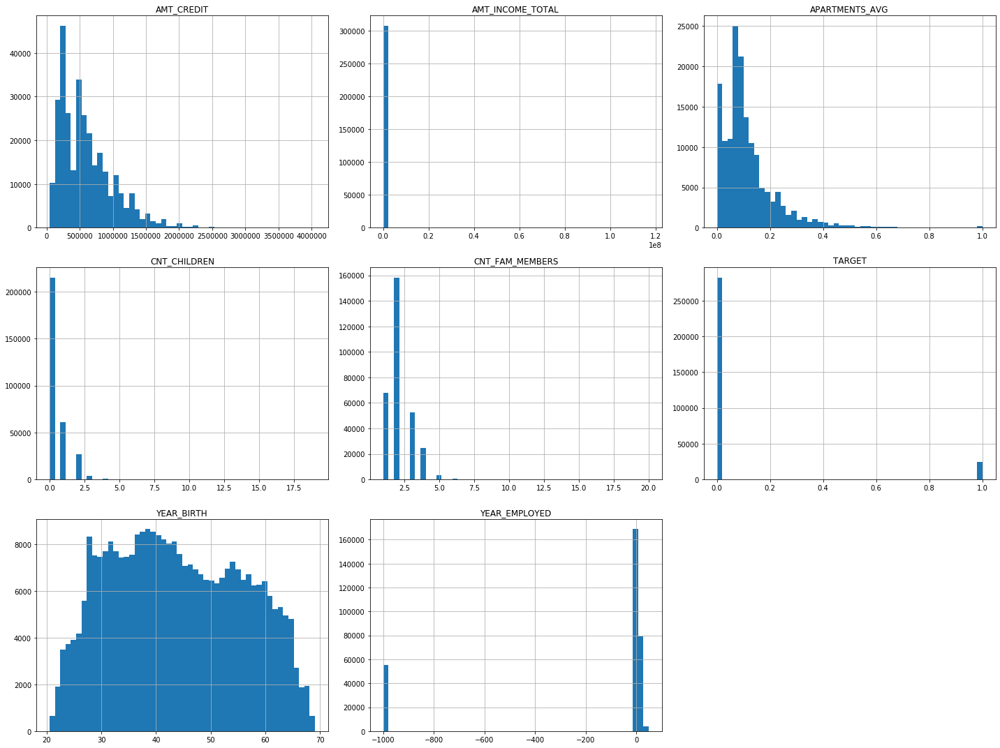

In [10]:
important_features.hist(bins=50, figsize=(20,15))
save_fig("important_attributes_histogram_plots")
plt.show()

1. **AMT_CREDIT**: Most the loan worth around 250k to 300k USD
2. **AMT_INCOME_TOTAL**: The is a huge outlier
3. **APARTMENT_AVG**: Most off the apartments where clients live are around 0.1 
4. **TARET**: The majority doesn't have any difficulty in paying back (only 25k/308k have difficulty)
5. **YEAR_EMPLOYED**: The majority has been employed for 1 to 2 years

# Replacing Outliers with Median Values or Deleting Outliers in Train Dataset for some features

### deal with outliers for amount of credit

In [11]:
# detect outliers with percentile
median = train_dataset['AMT_CREDIT'].quantile(0.50) 
print(median) # prints the 50th percentile value (or the median)
print(train_dataset['AMT_CREDIT'].quantile(0.95)) # prints the 95th percentile value (or the median)
print(train_dataset['AMT_CREDIT'].quantile(0.99)) # prints the 95th percentile value (or the median)

# detect outliers with IQR
# anything above (Q3+1.5*IQR) is outliers
Q1 = train_dataset['AMT_CREDIT'].quantile(0.25)
Q3 = train_dataset['AMT_CREDIT'].quantile(0.75)
IQR = Q3 - Q1
threshole = Q3 + 1.5*IQR
print(threshole)

513531.0
1350000.0
1854000.0
1616625.0


In [12]:
outlier_count = sum(map(lambda i: i > threshole, train_dataset['AMT_CREDIT'])) 
print(outlier_count)

6562


_There are 6.5k/308k instances are outliers. That's **2%**. We can comfortably replace this amount with median_

In [13]:
# Replaces all those values in the 'AMT_CREDIT' variable, which are greater than the threshole, with the median value
train_dataset['AMT_CREDIT'] = np.where(train_dataset['AMT_CREDIT'] > threshole, median, train_dataset['AMT_CREDIT'])

Saving figure AMT_CREDIT after removing outliers


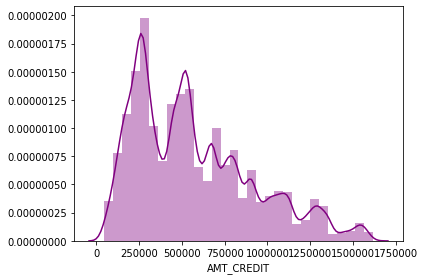

In [14]:
sns.distplot(train_dataset['AMT_CREDIT'], bins=30, color="purple", norm_hist = False)
save_fig("AMT_CREDIT after removing outliers")

### deal with outliers for amount of income total

In [15]:
# detect outliers with percentile
median = train_dataset['AMT_INCOME_TOTAL'].quantile(0.50) 
print(median) # prints the 50th percentile value (or the median)
print(train_dataset['AMT_INCOME_TOTAL'].quantile(0.95)) # prints the 95th percentile value (or the median)
print(train_dataset['AMT_INCOME_TOTAL'].quantile(0.99)) # prints the 95th percentile value (or the median)

super_outlier = train_dataset['AMT_INCOME_TOTAL'].quantile(0.9999)
print("super outlier threshole is: " + str(super_outlier))

# detect outliers with IQR
# anything above (Q3+1.5*IQR) is outliers
Q1 = train_dataset['AMT_INCOME_TOTAL'].quantile(0.25)
Q3 = train_dataset['AMT_INCOME_TOTAL'].quantile(0.75)
IQR = Q3 - Q1
threshole = Q3 + 1.5*IQR
print(threshole)

147150.0
337500.0
472500.0
super outlier threshole is: 2250000.0
337500.0


In [16]:
outlier_count = sum(map(lambda i: i > super_outlier, train_dataset['AMT_INCOME_TOTAL'])) 
print("Number of instance with a value higher than the .9999 quantile ({0}): {1}".format(super_outlier, outlier_count))

Number of instance with a value higher than the .9999 quantile (2250000.0): 20


In [17]:
# we will deal with outliers by getting rid of them 
train_dataset = train_dataset[train_dataset['AMT_INCOME_TOTAL'] <= super_outlier]
print(train_dataset.shape)

(307491, 122)


Saving figure AMT_INCOME_TOTAL after removing outliers


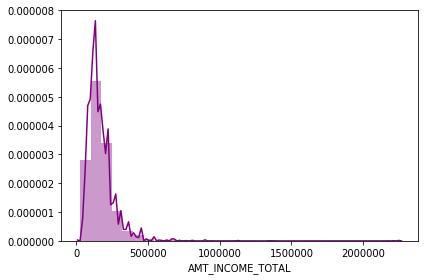

In [18]:
sns.distplot(train_dataset['AMT_INCOME_TOTAL'], bins=30, color="purple")
save_fig("AMT_INCOME_TOTAL after removing outliers")

_Still not good enough. We need to get rid all instances above around 800k to have a Gaussian-shaped graph_

In [19]:
outlier_count = sum(map(lambda i: i > 800000, train_dataset['AMT_INCOME_TOTAL'])) 
print("Number of instance with a value higher than the 800000: {0}".format(outlier_count))

Number of instance with a value higher than the 800000: 556


_We can handle losing another 600 instances. Let's do this_

In [20]:
# we will deal with outliers by getting rid of them 
train_dataset = train_dataset[train_dataset['AMT_INCOME_TOTAL'] <= 800000]
print(train_dataset.shape)

(306935, 122)


Saving figure AMT_INCOME_TOTAL after removing outliers


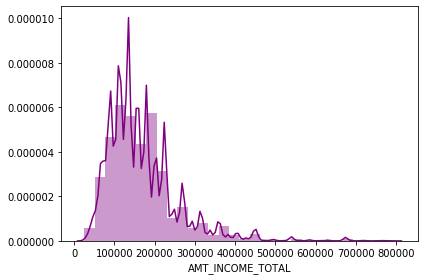

In [21]:
sns.distplot(train_dataset['AMT_INCOME_TOTAL'], bins=30, color="purple")
save_fig("AMT_INCOME_TOTAL after removing outliers")

_Ok we can work with this I guess. Most borrowers have an income around the range 100k to 200k_

**deal with outliers for apartment average**

In [22]:
# detect outliers with percentile
median = train_dataset['APARTMENTS_AVG'].quantile(0.50) 
print("median: {0}".format(median)) # prints the 50th percentile value (or the median)
print(train_dataset['APARTMENTS_AVG'].quantile(0.95)) # prints the 95th percentile value (or the median)
# print(train_dataset['APARTMENTS_AVG'].quantile(0.99)) # prints the 95th percentile value (or the median)

super_outlier = train_dataset['APARTMENTS_AVG'].quantile(0.99)
print("super outlier threshole is: " + str(super_outlier))

# detect outliers with IQR
# anything above (Q3+1.5*IQR) is outliers
Q1 = train_dataset['APARTMENTS_AVG'].quantile(0.25)
Q3 = train_dataset['APARTMENTS_AVG'].quantile(0.75)
IQR = Q3 - Q1
threshole = Q3 + 1.5*IQR
print("threshole: {0}".format(threshole))

median: 0.0876
0.3268
super outlier threshole is: 0.5443
threshole: 0.28469999999999995


In [23]:
outlier_count = sum(map(lambda i: i > super_outlier, train_dataset['APARTMENTS_AVG'])) 
print("Number of instance with AVG_APARTMENT higher than the .99 quantile ({0}): {1}".format(super_outlier, outlier_count))

Number of instance with AVG_APARTMENT higher than the .99 quantile (0.5443): 1500


In [24]:
print(train_dataset.shape)

(306935, 122)


In [25]:
train_dataset['APARTMENTS_AVG'].isnull().sum()

155878

_I just realize that we need to deal with missing value first before dealing with outliers. Apartment related variables have too many missing values. We will come back to them later_

### deal with outliers for number of children the client has

In [26]:
train_dataset['CNT_CHILDREN'].isnull().sum()

0

In [27]:
# detect outliers with percentile
median = train_dataset['CNT_CHILDREN'].quantile(0.50) 
print("median: {0}".format(median)) # prints the 50th percentile value (or the median)
print(".99 quantile: {0}".format(train_dataset['CNT_CHILDREN'].quantile(0.95))) # prints the 95th percentile value (or the median)
# print(train_dataset['APARTMENTS_AVG'].quantile(0.99)) # prints the 95th percentile value (or the median)

super_outlier = train_dataset['CNT_CHILDREN'].quantile(0.99)
print("super outlier threshole is: " + str(super_outlier))

# detect outliers with IQR
# anything above (Q3+1.5*IQR) is outliers
Q1 = train_dataset['CNT_CHILDREN'].quantile(0.25)
Q3 = train_dataset['CNT_CHILDREN'].quantile(0.75)
IQR = Q3 - Q1
threshole = Q3 + 1.5*IQR
print("threshole: {0}".format(threshole))

median: 0.0
.99 quantile: 2.0
super outlier threshole is: 3.0
threshole: 2.5


In [28]:
round(train_dataset['CNT_CHILDREN'].describe(), 3)

count    306935.000
mean          0.417
std           0.722
min           0.000
25%           0.000
50%           0.000
75%           1.000
max          19.000
Name: CNT_CHILDREN, dtype: float64

In [29]:
outlier_count = sum(map(lambda i: i == 19, train_dataset['CNT_CHILDREN'])) 
print("Number of instance with 19 as the value of CNT_CHILDREN is: " + str(outlier_count))

Number of instance with 19 as the value of CNT_CHILDREN is: 2


In [30]:
outlier_count = sum(map(lambda i: i > 7, train_dataset['CNT_CHILDREN'])) 
print("Number of borrower has more than 7 children: " + str(outlier_count))

Number of borrower has more than 7 children: 14


In [31]:
# we will deal with outliers by getting rid of them 
train_dataset = train_dataset[train_dataset['CNT_CHILDREN'] < 7]
print(train_dataset.shape)

(306914, 122)


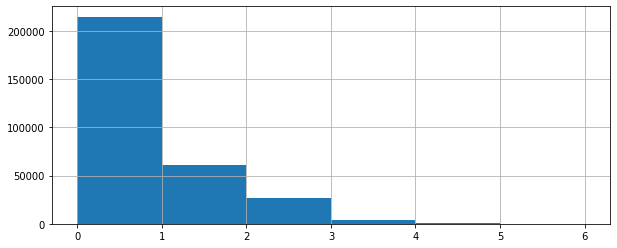

In [32]:
train_dataset['CNT_CHILDREN'].hist(bins=6, figsize=(10,4))
plt.show()

### deal with outliers for number of family member the client has

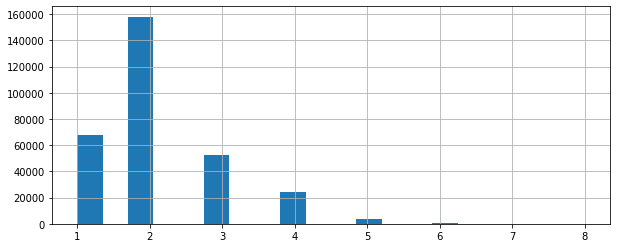

In [33]:
train_dataset['CNT_FAM_MEMBERS'].hist(bins=20, figsize=(10,4))
plt.show()

In [34]:
outlier_count = sum(map(lambda i: i > 8, train_dataset['CNT_FAM_MEMBERS'])) 
print("Number of borrower has more than 8 family member: " + str(outlier_count))

Number of borrower has more than 8 family member: 0


### deal with outliers for years of employed

How many days before the application the person started current employment

In [35]:
train_dataset['DAYS_BIRTH'] = (train_dataset['DAYS_BIRTH']*(-1))/365.25
train_dataset['DAYS_BIRTH'].head()

0    25.902806
1    45.900068
2    52.145106
3    52.032854
4    54.570842
Name: DAYS_BIRTH, dtype: float64

In [36]:
train_dataset['DAYS_EMPLOYED'] = (train_dataset['DAYS_EMPLOYED']*(-1))/365.25
train_dataset['DAYS_EMPLOYED'].head()

0    1.744011
1    3.252567
2    0.616016
3    8.320329
4    8.317591
Name: DAYS_EMPLOYED, dtype: float64

In [37]:
train_dataset = train_dataset.rename(columns={'DAYS_BIRTH': 'YEAR_BIRTH', 'DAYS_EMPLOYED': 'YEAR_EMPLOYED'})

In [38]:
train_dataset['YEAR_EMPLOYED'].isnull().sum()

0

In [39]:
train_dataset['YEAR_EMPLOYED'].describe()

count    306914.000000
mean       -174.988266
std         387.016287
min        -999.980835
25%           0.788501
50%           3.318275
75%           7.550992
max          49.040383
Name: YEAR_EMPLOYED, dtype: float64

In [40]:
outlier_count = sum(map(lambda i: i < 0, train_dataset['YEAR_EMPLOYED'])) 
print("Number of instance with noise data in YEAR_EMPLOYED: " + str(outlier_count))

Number of instance with noise data in YEAR_EMPLOYED: 55349


In [41]:
# Replaces all those values in the 'YEAR_EMPLOYED' variable which are less than 0 with 0
train_dataset['YEAR_EMPLOYED'] = np.where(train_dataset['YEAR_EMPLOYED'] < 0, 0, train_dataset['YEAR_EMPLOYED'])
round(train_dataset['YEAR_EMPLOYED'].describe(), 3)

count    306914.000
mean          5.349
std           6.316
min           0.000
25%           0.789
50%           3.318
75%           7.551
max          49.040
Name: YEAR_EMPLOYED, dtype: float64

Saving figure YEAR_EMPLOYED after removing outliers


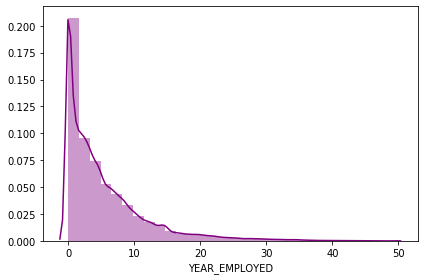

In [42]:
sns.distplot(train_dataset['YEAR_EMPLOYED'], bins=30, color="purple")
save_fig("YEAR_EMPLOYED after removing outliers")

**Before visualizing, let's scale the unit of some features**

In [43]:
train_dataset['AMT_INCOME_TOTAL'] = train_dataset['AMT_INCOME_TOTAL']/1000
train_dataset['AMT_CREDIT'] = train_dataset['AMT_CREDIT']/1000

train_dataset = train_dataset.rename(columns={'AMT_INCOME_TOTAL': 'AMT_INCOME_TOTAL_THOUSAND_DOLLAR', 'AMT_CREDIT': 'AMT_CREDIT_THOUSAND_DOLLAR'})
train_dataset.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL_THOUSAND_DOLLAR,AMT_CREDIT_THOUSAND_DOLLAR,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202.5,406.5975,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270.0,1293.5025,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67.5,135.0000,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135.0,312.6825,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121.5,513.0000,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


# Visualization

**pair plot all the most important features**

In [44]:
important_features = ['TARGET', 'NAME_CONTRACT_TYPE', 'AMT_INCOME_TOTAL_THOUSAND_DOLLAR', 'CODE_GENDER', 'CNT_CHILDREN',
             'FLAG_OWN_REALTY', 'AMT_CREDIT_THOUSAND_DOLLAR', 'APARTMENTS_AVG', 'OCCUPATION_TYPE', 
             'CNT_FAM_MEMBERS', 'ORGANIZATION_TYPE', 'NAME_FAMILY_STATUS', 'YEAR_EMPLOYED', 'YEAR_BIRTH']

important_features = train_dataset.filter(items=important_features)

print("important_features' shape: ", important_features.shape)

important_features' shape:  (306914, 14)


Saving figure important_attributes_pair_plots


<Figure size 1080x1080 with 0 Axes>

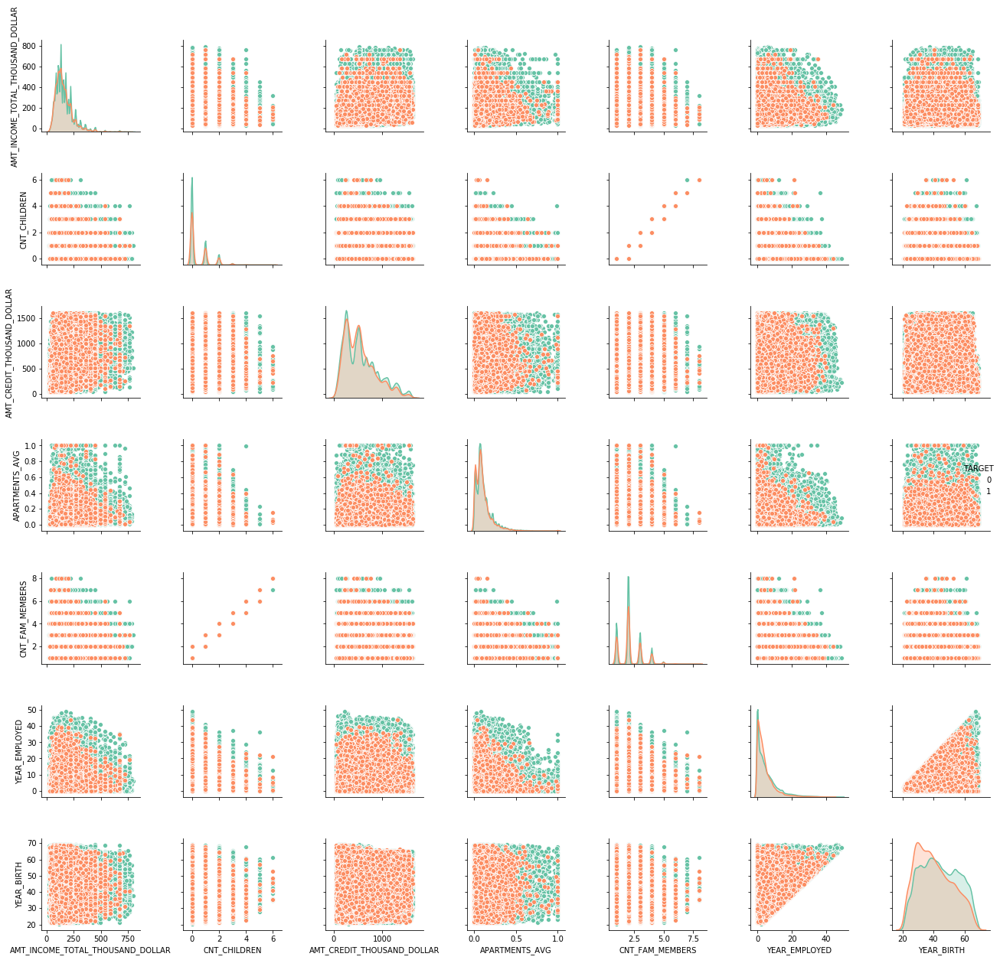

In [45]:
plt.figure(figsize=(15,15))
sns.pairplot(important_features, hue = "TARGET", palette="Set2")
save_fig("important_attributes_pair_plots")
plt.show()

## In Pair plots

**Amount of Credit VS Amount of Income**

In [45]:
sns.reset_orig()

Saving figure Amount of Credit VS Amount of Income with Target


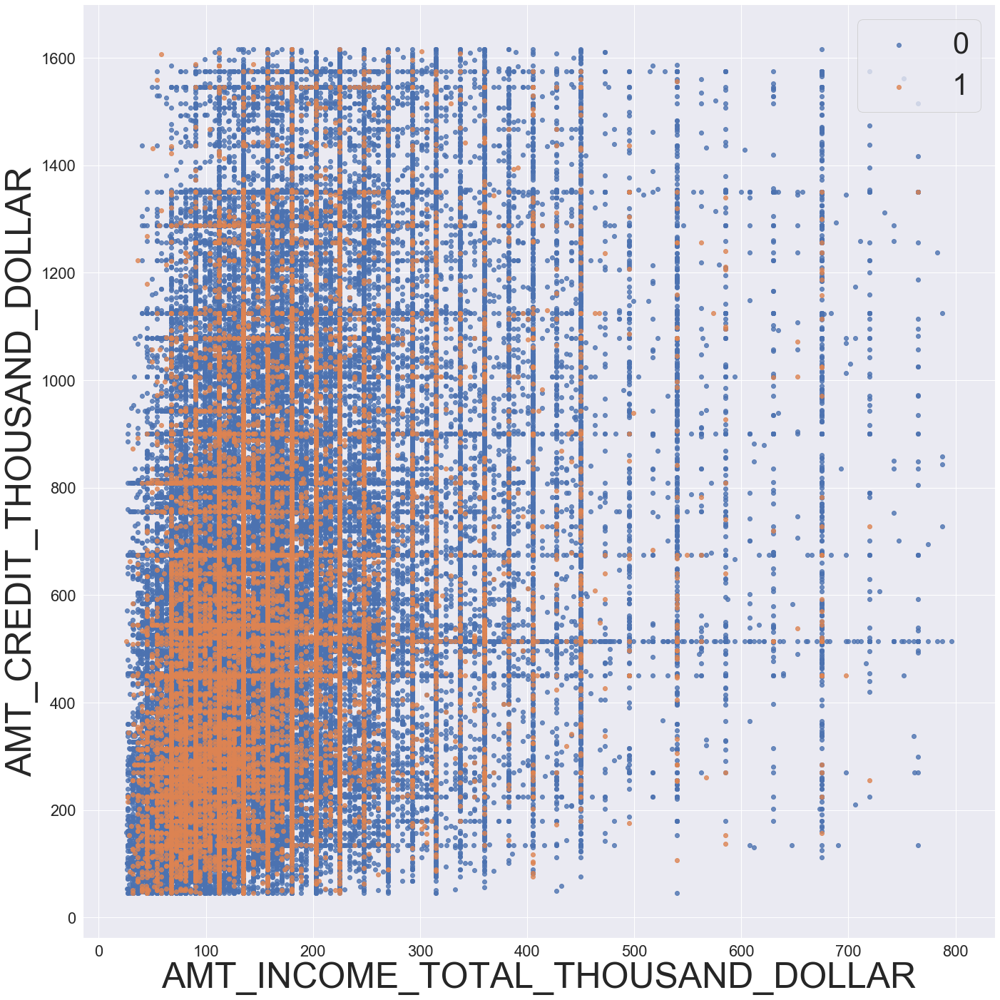

In [46]:
sns.set(font_scale = 2)

ax = sns.lmplot( x="AMT_INCOME_TOTAL_THOUSAND_DOLLAR", y="AMT_CREDIT_THOUSAND_DOLLAR", data=important_features, fit_reg=False, hue='TARGET', height=20, legend=False)
plt.legend(loc='upper right', fontsize = 'xx-large')

ax.set_xlabels("AMT_INCOME_TOTAL_THOUSAND_DOLLAR",fontsize=50)
ax.set_ylabels("AMT_CREDIT_THOUSAND_DOLLAR",fontsize=50)

save_fig("Amount of Credit VS Amount of Income with Target")

plt.show()

_Another graph with between these two features but without target_

Saving figure Amount of Credit VS Amount of Income without Target


<Figure size 3600x3600 with 0 Axes>

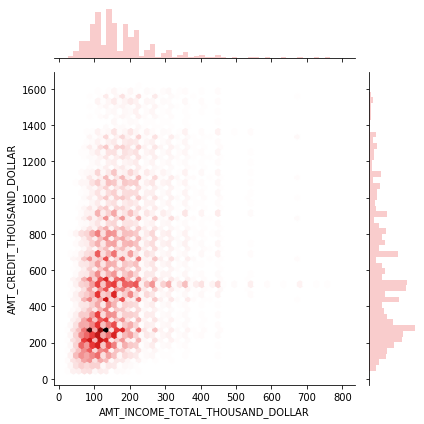

In [48]:
sns.reset_orig()

plt.figure(figsize=(50, 50))
sns.jointplot(x = "AMT_INCOME_TOTAL_THOUSAND_DOLLAR", y = "AMT_CREDIT_THOUSAND_DOLLAR", data = important_features, kind ="hex", color="lightcoral")
save_fig("Amount of Credit VS Amount of Income without Target")
plt.show()

**Number of years employed VS Amount of Credit**

Saving figure Number of years employed VS Amount of Credit with Target


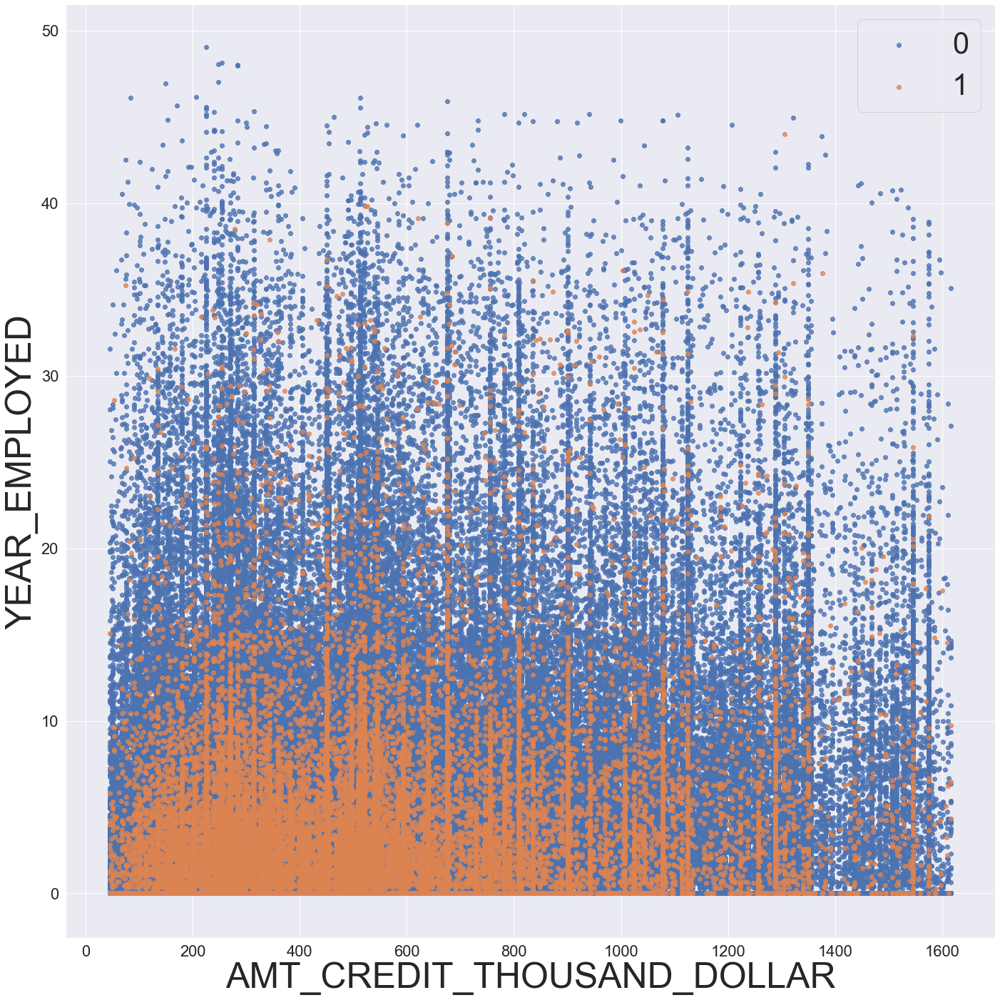

In [49]:
sns.set(font_scale = 2)

ax = sns.lmplot(x="AMT_CREDIT_THOUSAND_DOLLAR", y="YEAR_EMPLOYED", data=important_features, fit_reg=False, hue='TARGET', height=20, legend=False)
plt.legend(loc='upper right', fontsize = 'xx-large')

ax.set_xlabels("AMT_CREDIT_THOUSAND_DOLLAR",fontsize=50)
ax.set_ylabels("YEAR_EMPLOYED",fontsize=50)

save_fig("Number of years employed VS Amount of Credit with Target")

plt.show()

Saving figure Number of years employed VS Amount of Credit without Target


<Figure size 3600x3600 with 0 Axes>

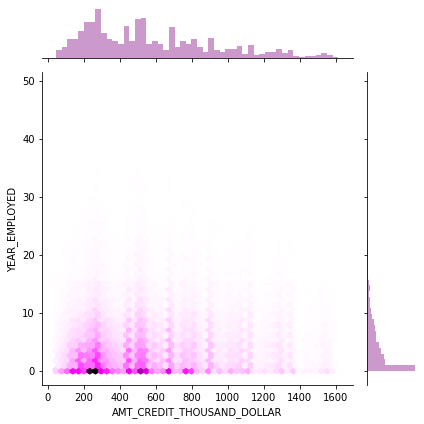

In [50]:
sns.reset_orig()

plt.figure(figsize=(50, 50))
sns.jointplot(x = "AMT_CREDIT_THOUSAND_DOLLAR", y = "YEAR_EMPLOYED", data = important_features, kind ="hex", color="purple")
save_fig("Number of years employed VS Amount of Credit without Target")
plt.show()

**Number of children VS Amount of Credit**

Saving figure Number of children VS Amount of Credit without Target


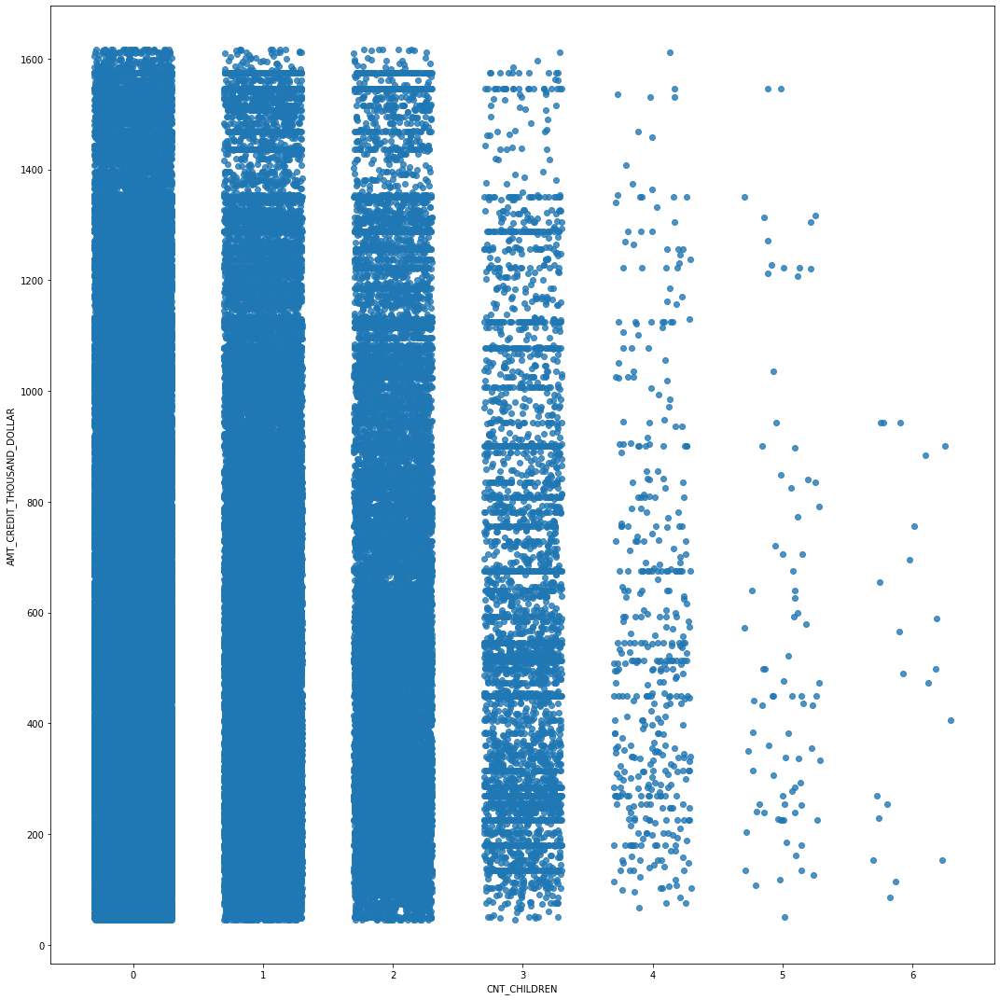

In [51]:
plt.figure(figsize=(15, 15))
sns.regplot(x = "CNT_CHILDREN", y = "AMT_CREDIT_THOUSAND_DOLLAR", data = important_features, x_jitter=.3, fit_reg = False)
save_fig("Number of children VS Amount of Credit without Target")
plt.show()

**Apartment Avg vs Credit and Income plots**

Saving figure The size of the borrower's apartment VS Amount of Credit with Target


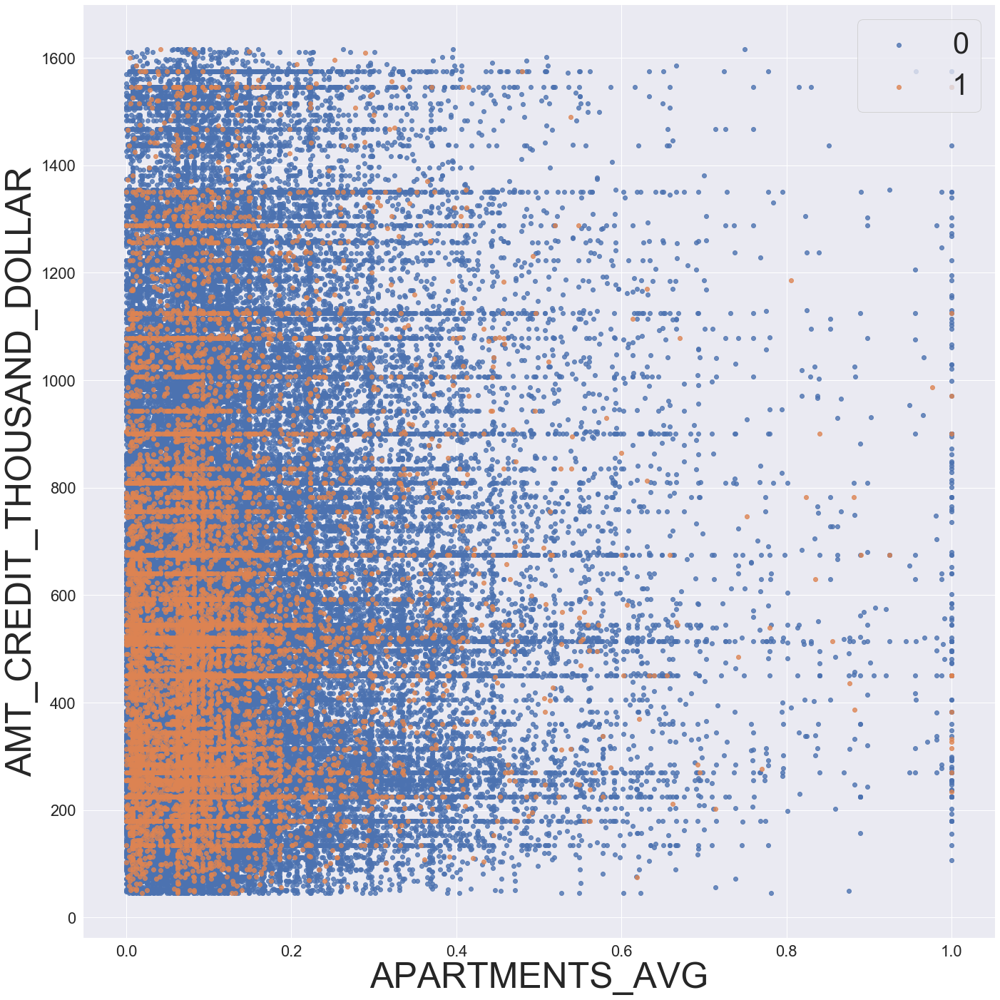

In [61]:
sns.set(font_scale = 2)

ax = sns.lmplot(x="APARTMENTS_AVG", y="AMT_CREDIT_THOUSAND_DOLLAR", data=important_features, fit_reg=False, hue='TARGET', height=20, legend=False)
plt.legend(loc='upper right', fontsize = 'xx-large')

ax.set_xlabels("APARTMENTS_AVG",fontsize=50)
ax.set_ylabels("AMT_CREDIT_THOUSAND_DOLLAR",fontsize=50)

save_fig("The size of the borrower's apartment VS Amount of Credit with Target")

plt.show()

Saving figure The size of the borrower's apartment VS Amount of total income with Target


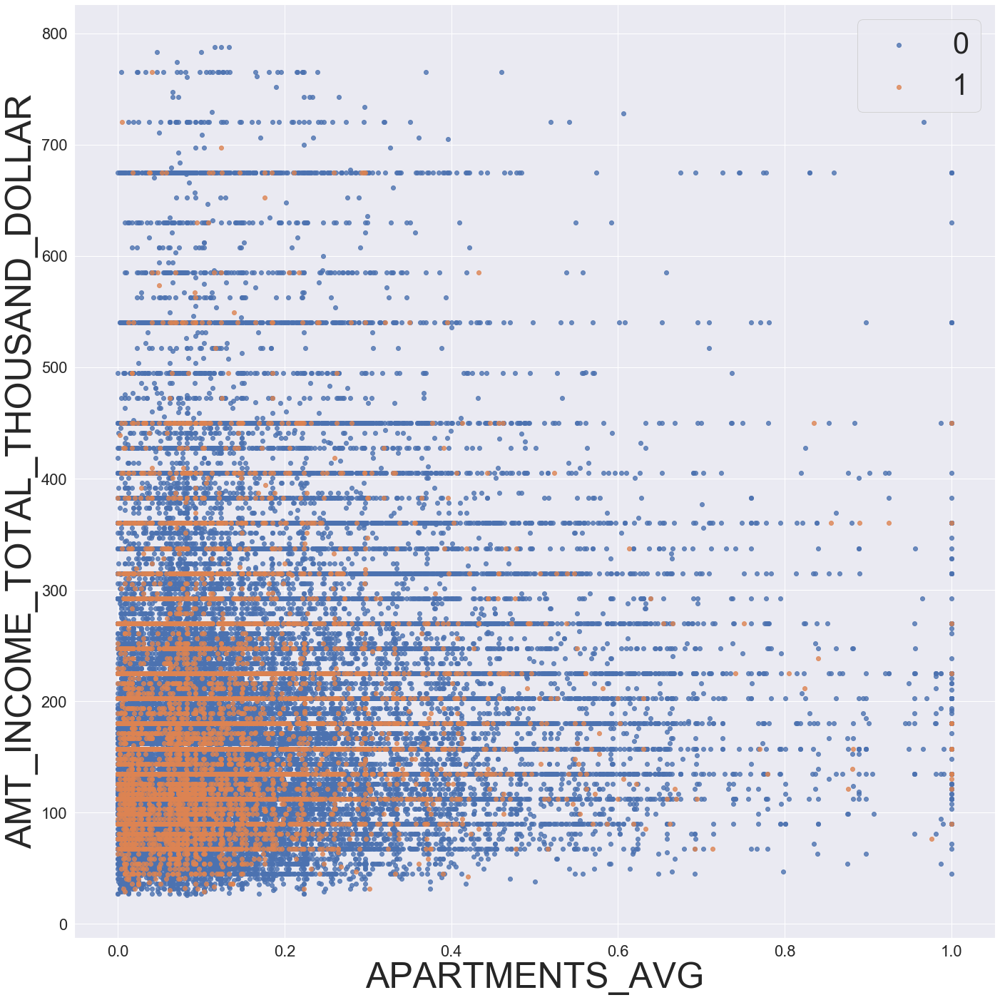

In [63]:
sns.set(font_scale = 2)

ax = sns.lmplot(x="APARTMENTS_AVG", y="AMT_INCOME_TOTAL_THOUSAND_DOLLAR", data=important_features, fit_reg=False, hue='TARGET', height=20, legend=False)
plt.legend(loc='upper right', fontsize = 'xx-large')

ax.set_xlabels("APARTMENTS_AVG",fontsize=50)
ax.set_ylabels("AMT_INCOME_TOTAL_THOUSAND_DOLLAR",fontsize=50)

save_fig("The size of the borrower's apartment VS Amount of total income with Target")

plt.show()

**NAME_CONTRACT_TYPE and some other correlations**

Saving figure important_attributes_histogram_plots


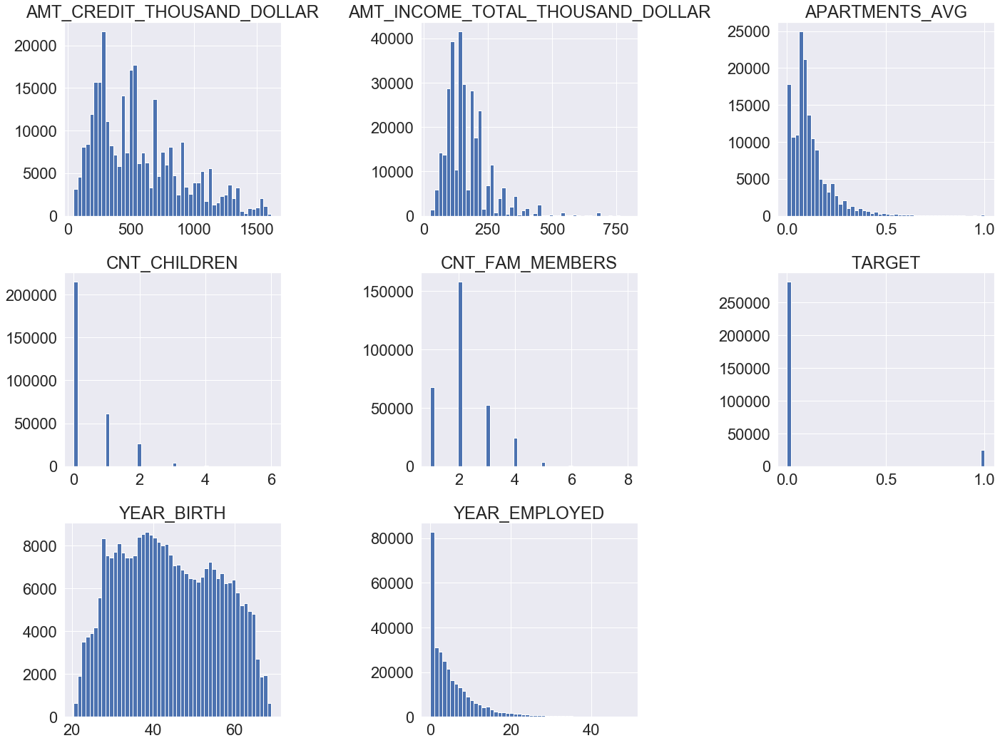

In [47]:
important_features.hist(bins=50, figsize=(20,15))
save_fig("important_attributes_histogram_plots")
plt.show()

Saving figure NAME_CONTRACT_TYPE


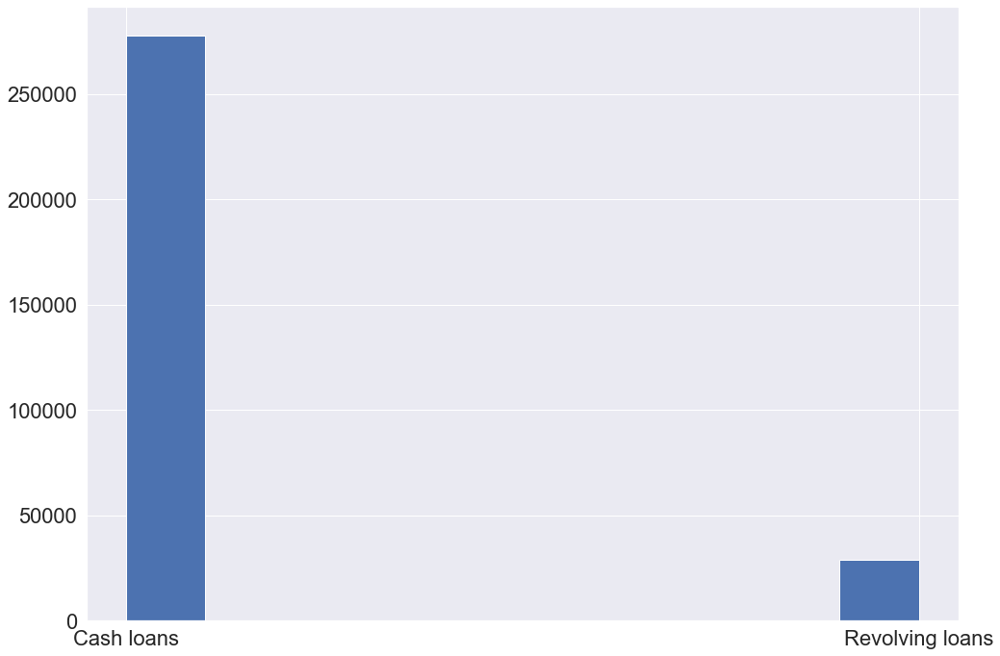

In [49]:
train_dataset['NAME_CONTRACT_TYPE'].hist(figsize=(15,10))
save_fig("NAME_CONTRACT_TYPE")

In [50]:
train_dataset['NAME_CONTRACT_TYPE'] = np.where(train_dataset['NAME_CONTRACT_TYPE'] == 'Revolving loans', 1, 0) 
train_dataset['NAME_CONTRACT_TYPE'].head()

0    0
1    0
2    1
3    0
4    0
Name: NAME_CONTRACT_TYPE, dtype: int32

In [51]:
train_dataset['NAME_CONTRACT_TYPE'].corr(train_dataset['TARGET']).round(2)

-0.03

In [52]:
train_dataset['CNT_CHILDREN'].corr(train_dataset['CNT_FAM_MEMBERS']).round(2)

0.88

The type of loan does not correlates that much to the Target value

In [54]:
train_dataset['AMT_ANNUITY'].corr(train_dataset['AMT_CREDIT_THOUSAND_DOLLAR']).round(2)

0.68

### NAME_INCOME_TYPE

Clients income type (businessman, working, maternity leave,…)

In [58]:
train_dataset.NAME_INCOME_TYPE.value_counts()

Working                 158573
Commercial associate     71280
Pensioner                55337
State servant            21672
Unemployed                  22
Student                     18
Businessman                  7
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64

Saving figure NAME_INCOME_TYPE with hue=TARGET


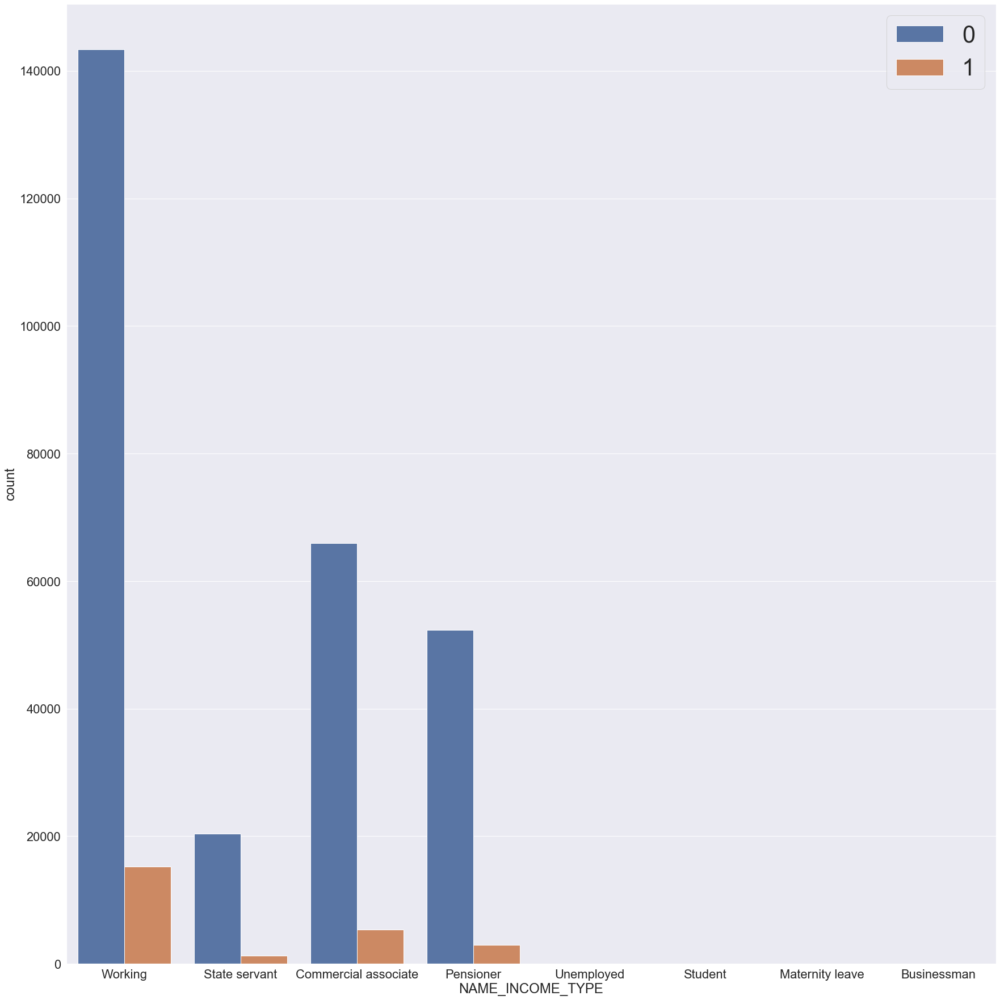

In [66]:
plt.figure(figsize=(25, 25))
ax = sns.countplot(x="NAME_INCOME_TYPE", hue="TARGET", data=train_dataset)
plt.legend(loc='upper right', fontsize = 'xx-large')

save_fig("NAME_INCOME_TYPE with hue=TARGET")
plt.show()

### NAME_EDUCATION_TYPE

Level of highest education the client achieved

In [67]:
train_dataset.NAME_EDUCATION_TYPE.value_counts()

Secondary / secondary special    218241
Higher education                  74448
Incomplete higher                 10252
Lower secondary                    3811
Academic degree                     162
Name: NAME_EDUCATION_TYPE, dtype: int64

Saving figure NAME_EDUCATION_TYPE with hue=TARGET


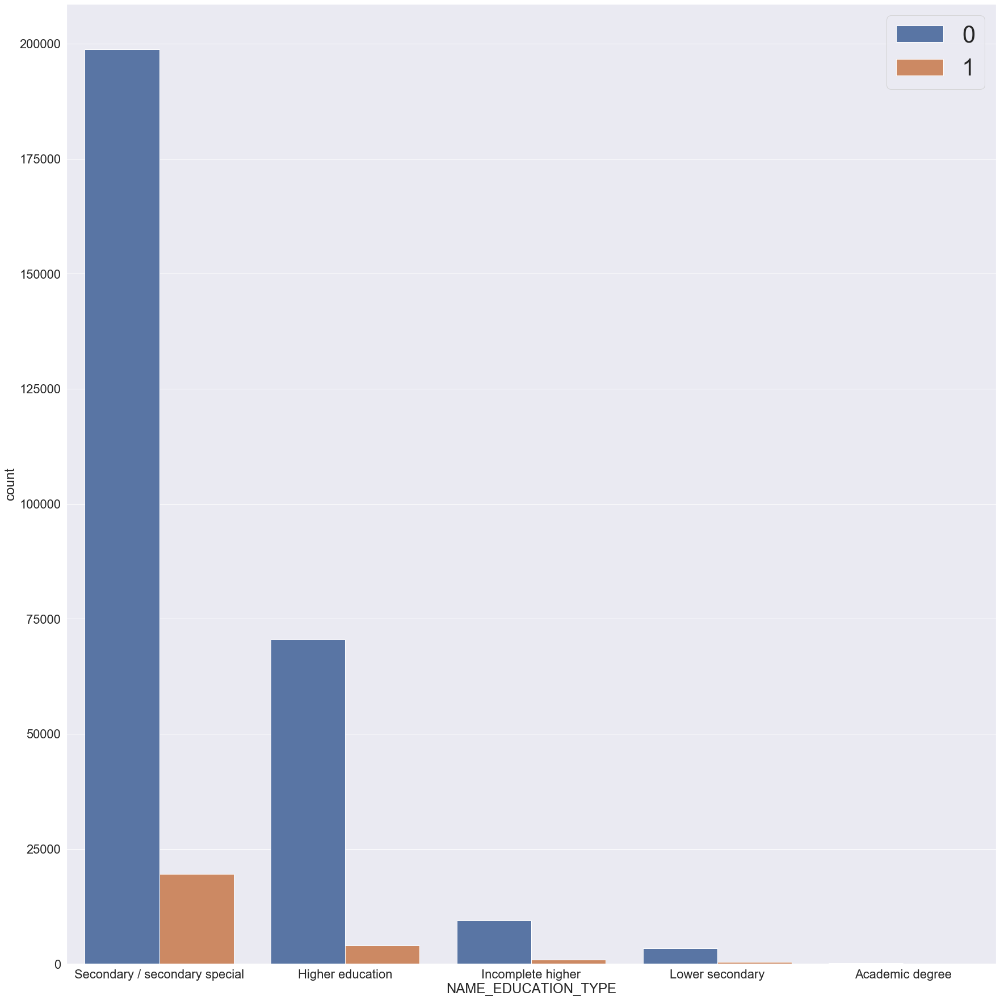

In [68]:
plt.figure(figsize=(25, 25))
ax = sns.countplot(x="NAME_EDUCATION_TYPE", hue="TARGET", data=train_dataset)
plt.legend(loc='upper right', fontsize = 'xx-large')

save_fig("NAME_EDUCATION_TYPE with hue=TARGET")
plt.show()

### NAME_FAMILY_STATUS

In [69]:
train_dataset.NAME_FAMILY_STATUS.value_counts()

Married                 196018
Single / not married     45354
Civil marriage           29730
Separated                19733
Widow                    16077
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64

Saving figure NAME_FAMILY_STATUS with hue=TARGET


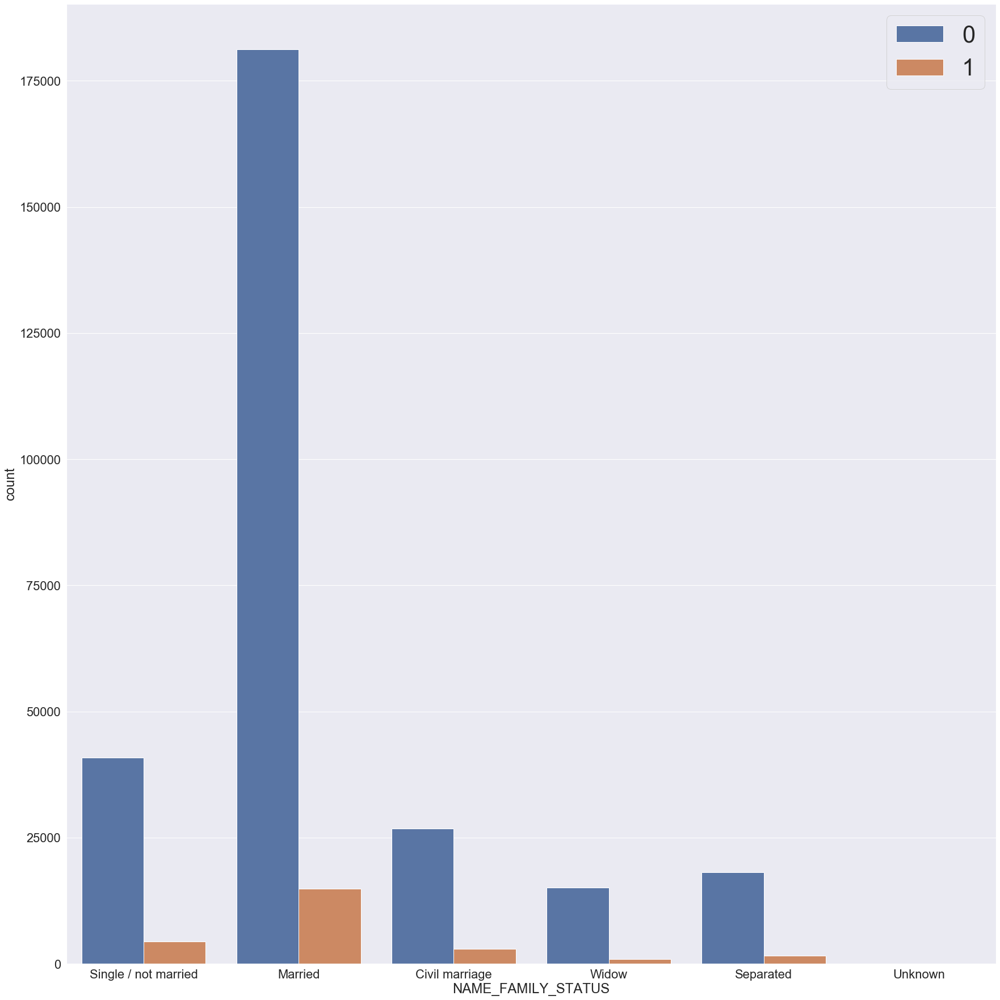

In [70]:
plt.figure(figsize=(25, 25))
ax = sns.countplot(x="NAME_FAMILY_STATUS", hue="TARGET", data=train_dataset)
plt.legend(loc='upper right', fontsize = 'xx-large')

save_fig("NAME_FAMILY_STATUS with hue=TARGET")
plt.show()

### NAME_HOUSING_TYPE

In [71]:
train_dataset.NAME_HOUSING_TYPE.value_counts()

House / apartment      272323
With parents            14822
Municipal apartment     11165
Rented apartment         4875
Office apartment         2608
Co-op apartment          1121
Name: NAME_HOUSING_TYPE, dtype: int64

Saving figure NAME_HOUSING_TYPE with hue=TARGET


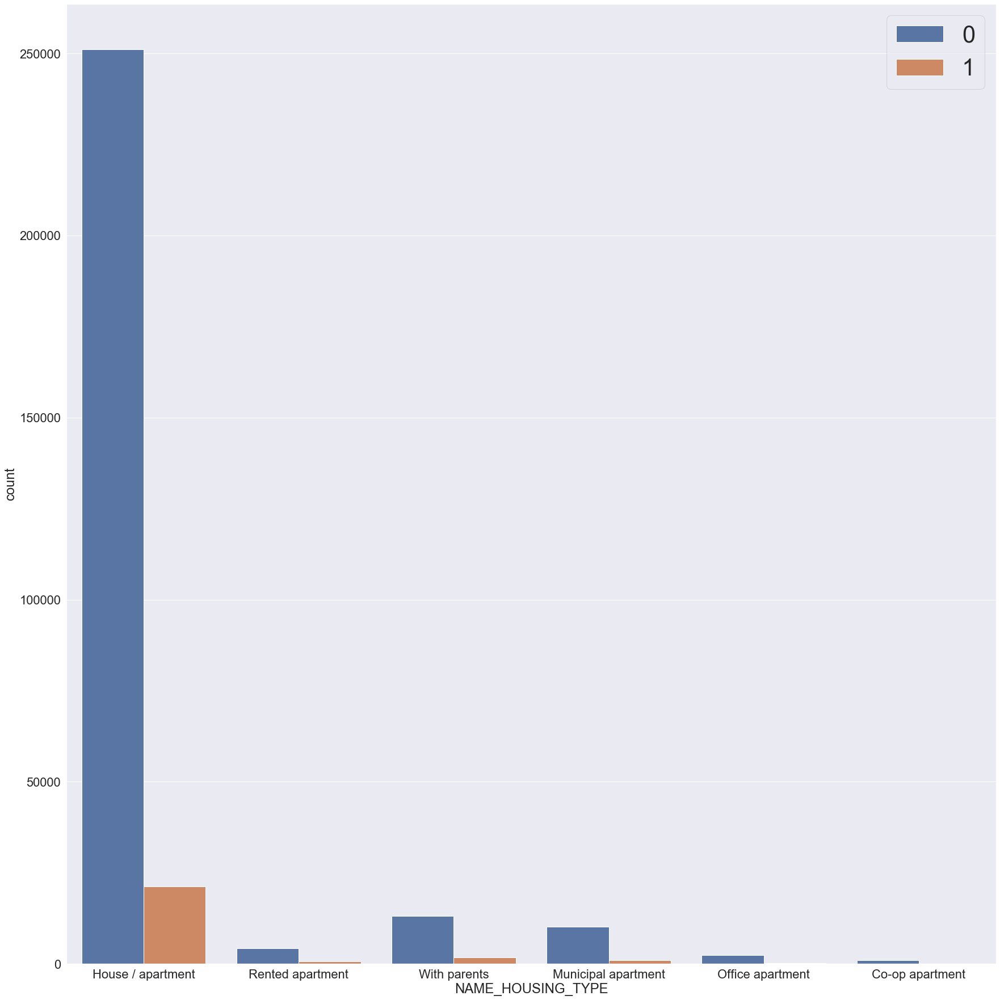

In [72]:
plt.figure(figsize=(25, 25))
ax = sns.countplot(x="NAME_HOUSING_TYPE", hue="TARGET", data=train_dataset)
plt.legend(loc='upper right', fontsize = 'xx-large')

save_fig("NAME_HOUSING_TYPE with hue=TARGET")
plt.show()

### OCCUPATION_TYPE

In [73]:
train_dataset.OCCUPATION_TYPE.value_counts()

Laborers                 55152
Sales staff              32076
Core staff               27530
Managers                 21044
Drivers                  18591
High skill tech staff    11365
Accountants               9786
Medicine staff            8534
Security staff            6717
Cooking staff             5946
Cleaning staff            4649
Private service staff     2649
Low-skill Laborers        2093
Waiters/barmen staff      1347
Secretaries               1302
Realty agents              751
HR staff                   563
IT staff                   524
Name: OCCUPATION_TYPE, dtype: int64

Saving figure OCCUPATION_TYPE with hue=TARGET


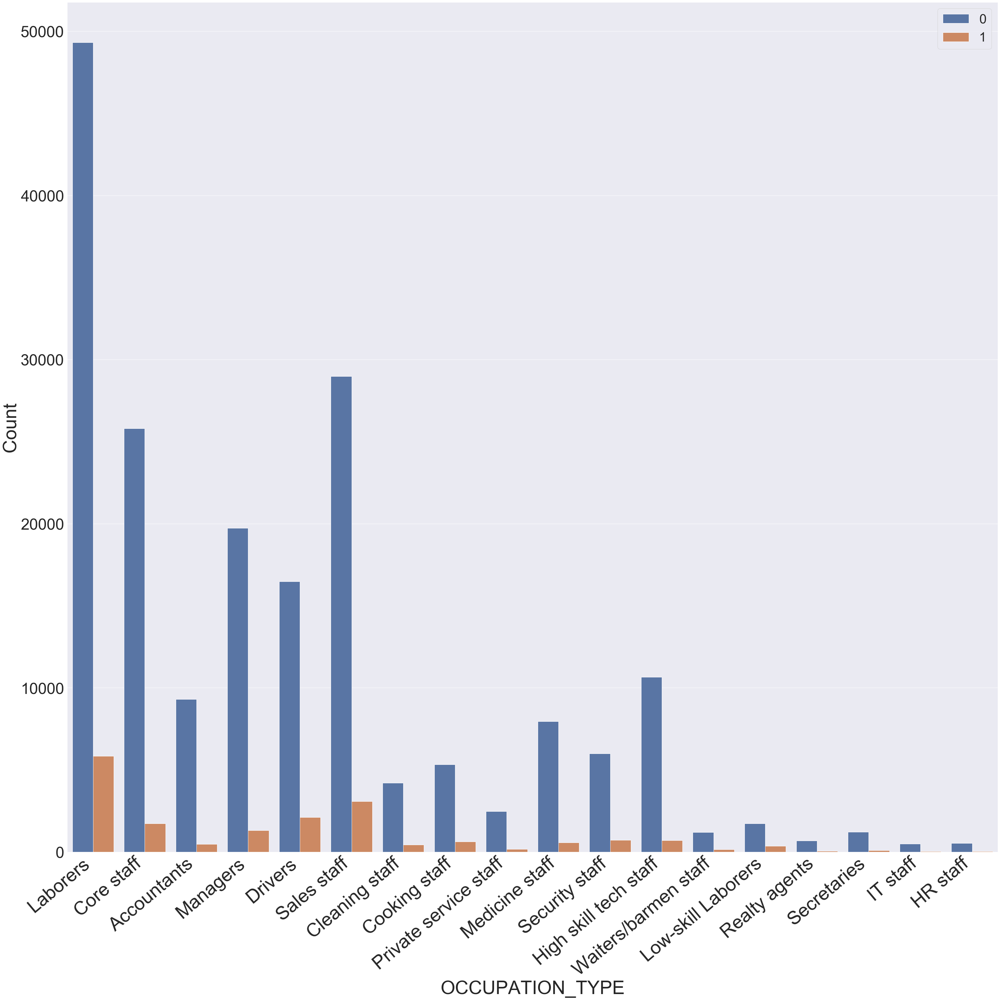

In [90]:
plt.figure(figsize=(45, 45))
ax = sns.countplot(x="OCCUPATION_TYPE", hue="TARGET", data=train_dataset)
plt.legend(loc='upper right', fontsize = 'xx-large')

# scale x,ytick labels
ax.set_xticklabels(ax.get_xticklabels(), fontsize = 60, rotation=40, ha="right")
# ax.set_yticklabels(y_ticks, rotation=0, fontsize=60)

# set x,y labels
plt.xlabel('OCCUPATION_TYPE', fontsize = 60)
plt.ylabel('Count', fontsize = 60)

save_fig("OCCUPATION_TYPE with hue=TARGET")
plt.show()

### ORGANIZATION_TYPE

In [91]:
train_dataset.ORGANIZATION_TYPE.value_counts()

Business Entity Type 3    67761
XNA                       55349
Self-employed             38345
Other                     16647
Medicine                  11178
Business Entity Type 2    10534
Government                10398
School                     8884
Trade: type 7              7813
Kindergarten               6876
Construction               6705
Business Entity Type 1     5967
Transport: type 4          5390
Trade: type 3              3488
Industry: type 9           3356
Industry: type 3           3275
Security                   3244
Housing                    2954
Industry: type 11          2698
Military                   2630
Bank                       2483
Agriculture                2452
Police                     2338
Transport: type 2          2203
Postal                     2154
Security Ministries        1970
Trade: type 2              1893
Restaurant                 1807
Services                   1572
University                 1323
Industry: type 7           1306
Transpor

### Age and Gender

In [92]:
train_dataset = train_dataset.rename(columns={'YEAR_BIRTH':'AGE'})

In [94]:
train_dataset.CODE_GENDER.value_counts()

F      202210
M      104700
XNA         4
Name: CODE_GENDER, dtype: int64

Saving figure CODE_GENDER with hue=TARGET


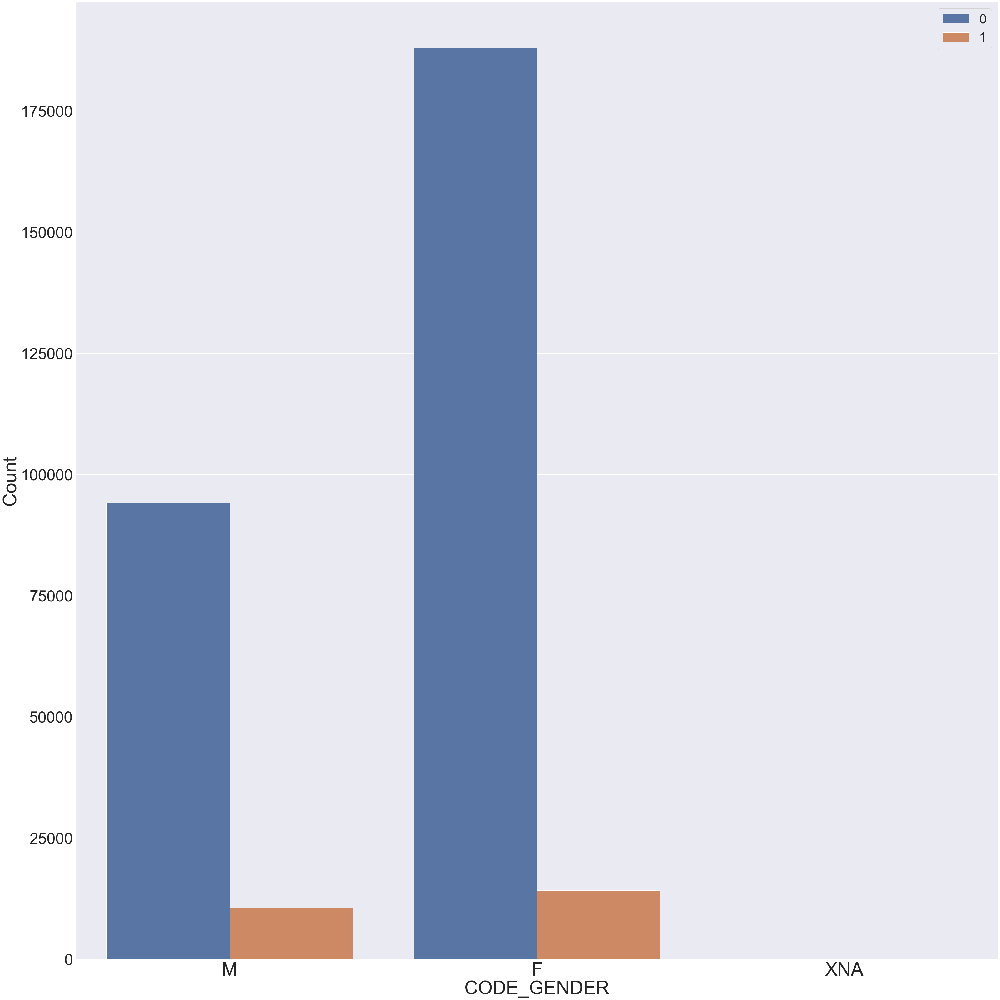

In [95]:
plt.figure(figsize=(45, 45))
ax = sns.countplot(x="CODE_GENDER", hue="TARGET", data=train_dataset)
plt.legend(loc='upper right', fontsize = 'xx-large')

# scale x,ytick labels
ax.set_xticklabels(ax.get_xticklabels(), fontsize = 60)
# ax.set_yticklabels(y_ticks, rotation=0, fontsize=60)

# set x,y labels
plt.xlabel('CODE_GENDER', fontsize = 60)
plt.ylabel('Count', fontsize = 60)

save_fig("CODE_GENDER with hue=TARGET")
plt.show()

In [96]:
train_dataset.to_csv('application_train_after_visualization_and_outlier_process.csv')

## _Change working environment_

In [2]:
# numpy and pandas for data manipulation
import numpy as np
import pandas as pd 

# matplotlib and seaborn for plotting
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# Training data
train_dataset = pd.read_csv('application_train_after_visualization_and_outlier_process.csv')

print('Train data shape: ', train_dataset.shape)

train_dataset.head()

Train data shape:  (306914, 123)


,Unnamed: 0,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL_THOUSAND_DOLLAR,AMT_CREDIT_THOUSAND_DOLLAR,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,0,100002,1,0,M,N,Y,0,202.5,406.5975,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,1,100003,0,0,F,N,N,0,270.0,1293.5025,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,100004,0,1,M,Y,Y,0,67.5,135.0000,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,100006,0,0,F,N,Y,0,135.0,312.6825,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,4,100007,0,0,M,N,Y,0,121.5,513.0000,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
train_dataset.columns

Index(['Unnamed: 0', 'SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE',
       'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL_THOUSAND_DOLLAR', 'AMT_CREDIT_THOUSAND_DOLLAR',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=123)

In [5]:
train_dataset = train_dataset.drop(columns=['Unnamed: 0'])
print('Train data shape: ', train_dataset.shape)

Train data shape:  (306914, 122)


_After doing some visualization and data exploration, I changed my mind on the list of important features. Here is the new list_

In [6]:
important_features = ['TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 
                      'AMT_INCOME_TOTAL_THOUSAND_DOLLAR', 'AMT_CREDIT_THOUSAND_DOLLAR', 'AMT_ANNUITY',
                      'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 
                      'AGE', 'YEAR_EMPLOYED', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'APARTMENTS_AVG']

important_features = train_dataset.filter(items=important_features)

print("important_features' shape: ", important_features.shape)

important_features' shape:  (306914, 17)


AttributeError: 'PairGrid' object has no attribute 'set_xticklabels'

<Figure size 3600x3600 with 0 Axes>

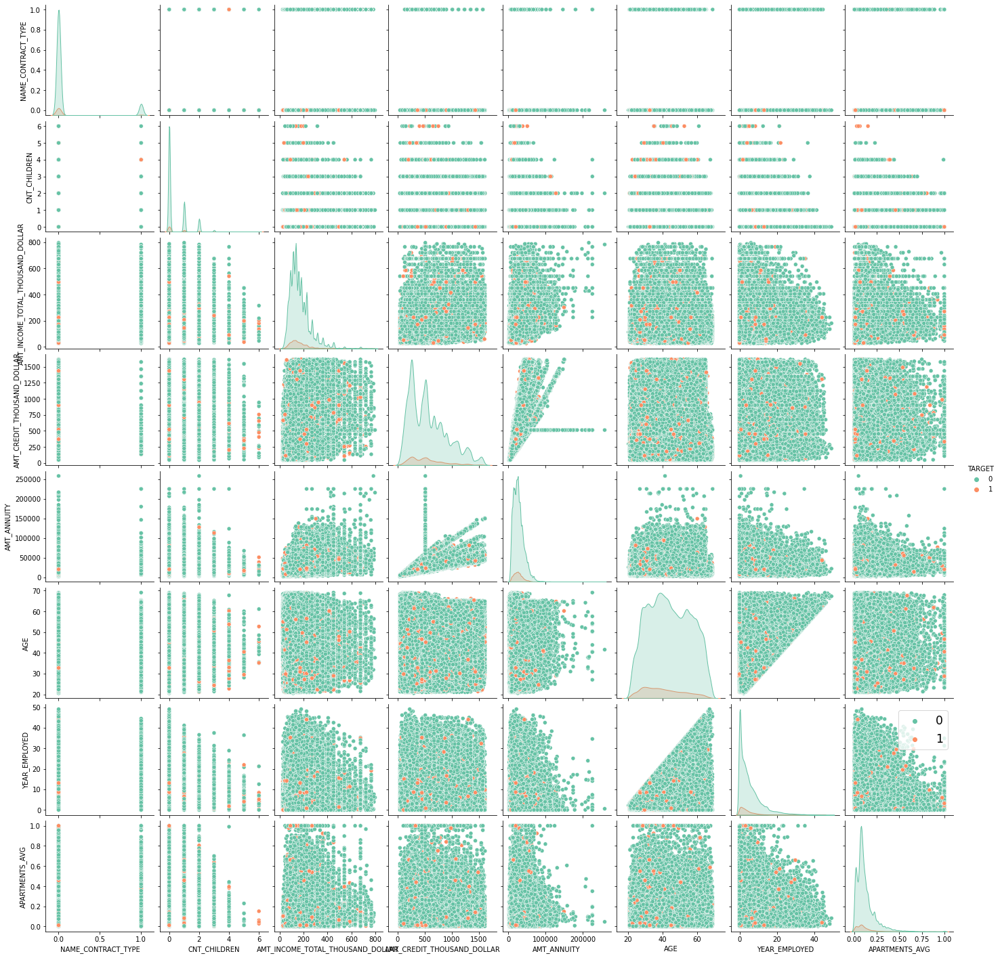

In [7]:
plt.figure(figsize=(50,50))

# main plot
ax = sns.pairplot(important_features, hue = "TARGET", palette="Set2")
plt.legend(fontsize = 'xx-large')

# scale x,ytick labels
ax.set_xticklabels(ax.get_xticklabels(), fontsize = 60)
# ax.set_yticklabels(y_ticks, rotation=0, fontsize=60)

plt.show()

### Plot comparing between Male and Female

In [9]:
# replace XNA values in Gender with missing value
train_dataset['CODE_GENDER'] = np.where(train_dataset['CODE_GENDER'] == "XNA", None, train_dataset['CODE_GENDER'])
train_dataset.CODE_GENDER.value_counts()

F    202210
M    104700
Name: CODE_GENDER, dtype: int64

**_NAME_EDUCATION_TYPE with TARGET and GENDER_**

<Figure size 3600x3600 with 0 Axes>

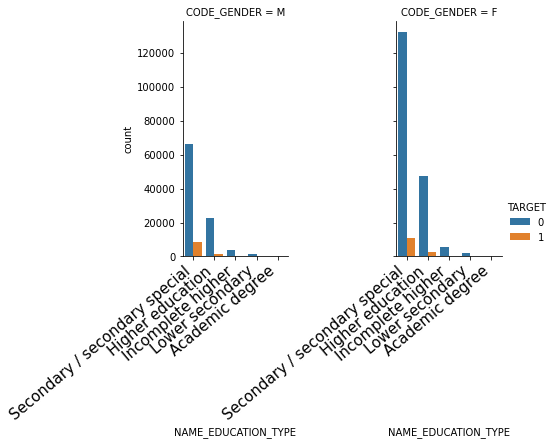

In [16]:
plt.figure(figsize=(50,50))

ax = sns.catplot(x="NAME_EDUCATION_TYPE", hue="TARGET", col="CODE_GENDER",
                 data=train_dataset, kind="count", height=4, aspect=.7)

# set xticklabel
ax.set_xticklabels(fontsize = 15, rotation=40, ha="right")
# ax.set_yticklabels(y_ticks, rotation=0, fontsize=60)

plt.show()

**_AGE with INCOME_**

<Figure size 10000x10000 with 0 Axes>

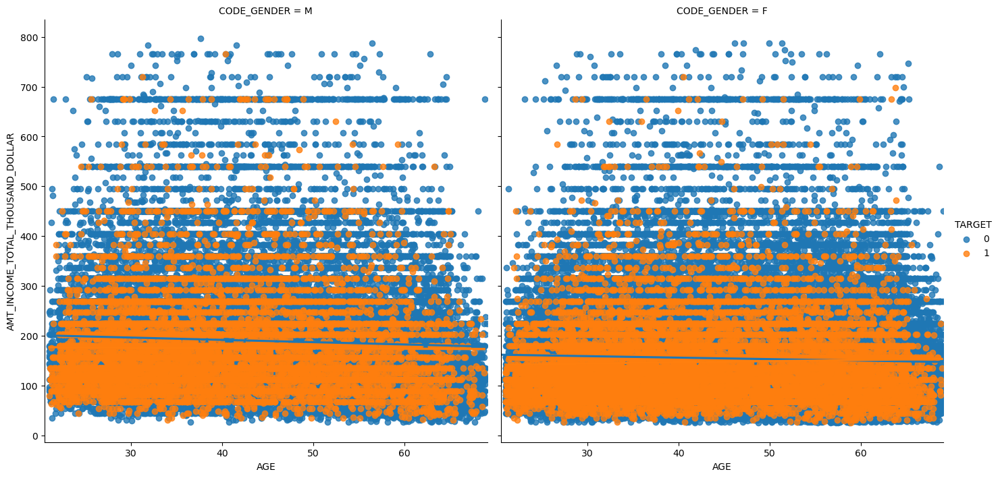

In [20]:
sns.reset_orig()

ax = sns.lmplot(x="AGE", y="AMT_INCOME_TOTAL_THOUSAND_DOLLAR", hue="TARGET", col="CODE_GENDER", 
                data=train_dataset, height=7, aspect=1)

plt.show()

**_x="AMT_CREDIT_THOUSAND_DOLLAR", y="AMT_INCOME_TOTAL_THOUSAND_DOLLAR", row="TARGET", col="CODE_GENDER"_**

<Figure size 640x480 with 0 Axes>

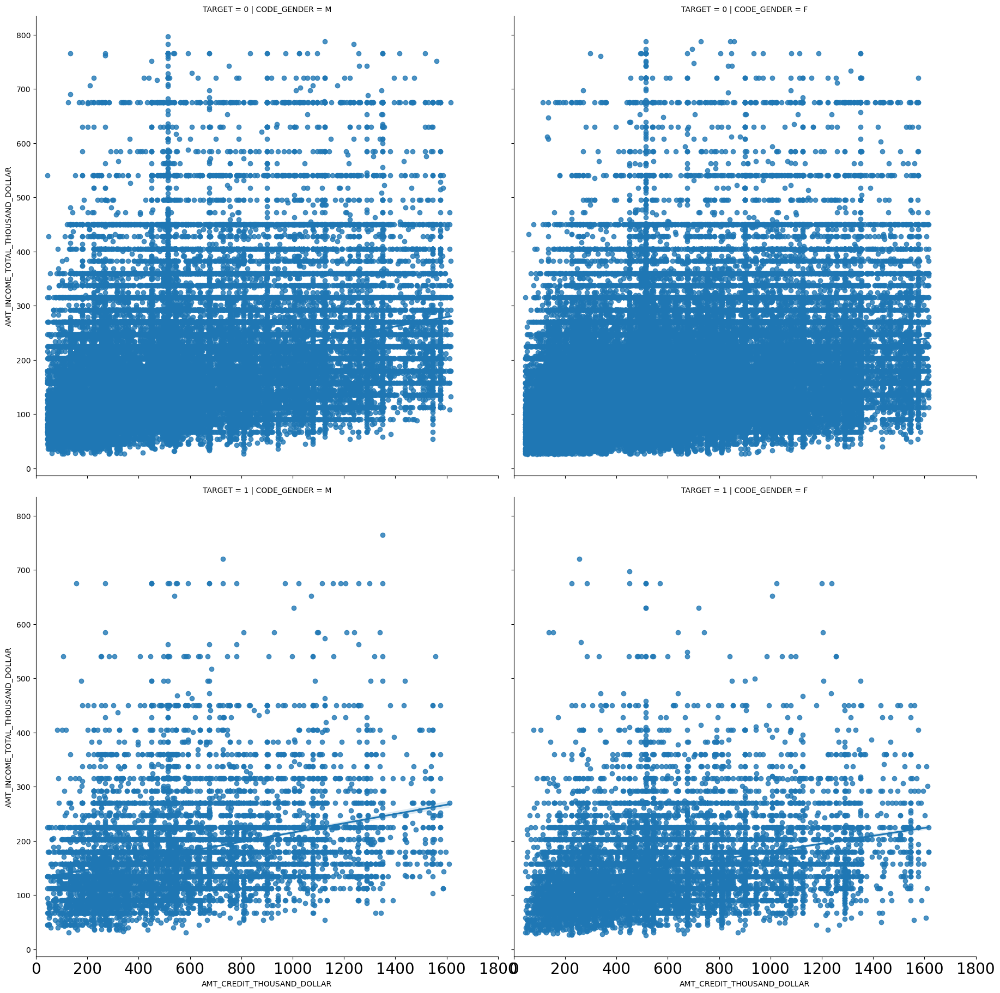

In [26]:
sns.reset_orig()

plt.figure()

ax = sns.lmplot(x="AMT_CREDIT_THOUSAND_DOLLAR", y="AMT_INCOME_TOTAL_THOUSAND_DOLLAR", 
                row="TARGET", col="CODE_GENDER", 
                data=train_dataset, palette="m", height=9, aspect=1)

# scale x,ytick labels
ax.set_xticklabels(fontsize = 20)

plt.show()

### FLAG_OWN_REALTY

In [27]:
train_dataset.FLAG_OWN_REALTY.value_counts()

Y    212932
N     93982
Name: FLAG_OWN_REALTY, dtype: int64

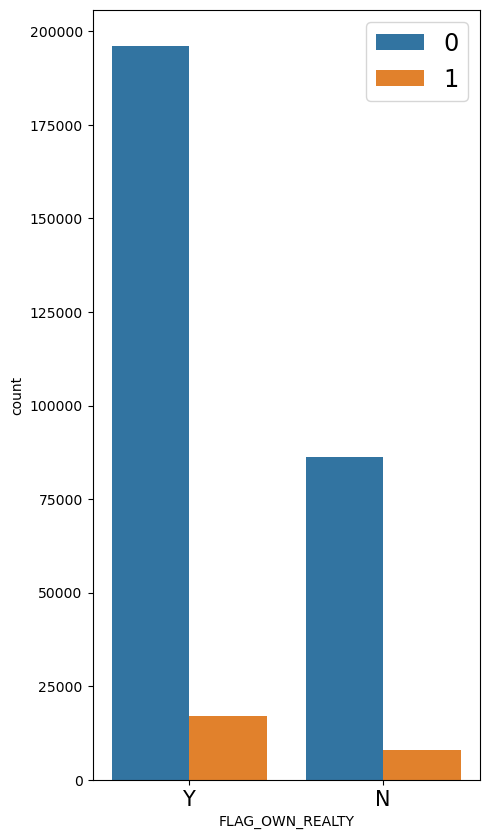

In [31]:
plt.figure(figsize=(5, 10))

ax = sns.countplot(x="FLAG_OWN_REALTY", hue="TARGET", data=train_dataset)
plt.legend(loc='upper right', fontsize = 'xx-large')

# scale x,ytick labels
ax.set_xticklabels(ax.get_xticklabels(), fontsize = 15)

plt.show()

In [32]:
corr = train_dataset['NAME_CONTRACT_TYPE'].corr(train_dataset['TARGET']).round(2)

print("The correlation between FLAG_OWN_REALTY and TARGET is: {0}".format(corr))

The correlation between FLAG_OWN_REALTY and TARGET is: -0.03


# The end of 1st Notebook

We get a broad picture of out dataset